# Generating Data

In [2]:
using Random, Distributions, DifferentialEquations, Plots, LinearAlgebra

Random.seed!(12)
num_observations = 3
clusters = 1
dim = 10
spread = 10
margin = rand(0:10,dim)*50

C = Diagonal(ones(dim))
x1, x2 = rand(MvNormal(rand(0:spread,dim), C), num_observations), rand(MvNormal(rand(0:spread,dim), C), num_observations)

for i in 1:clusters
    if i == 1
        x1 = transpose(rand(MvNormal(rand(0:spread,dim) + margin, C), num_observations))
        x2 = transpose(rand(MvNormal(rand(0:spread,dim), C), num_observations))
    else
        x1_temp = transpose(rand(MvNormal(rand(0:spread,dim) + margin, C), num_observations))
        x1 = cat(x1, x1_temp)
        x2_temp = transpose(rand(MvNormal(rand(0:spread,dim), C), num_observations))
        x2 = cat(x2_temp)
    end
end

simulated_separableish_features = vcat(x1,x2)
simulated_labels = vcat(zeros(size(x1)[1]), ones(size(x2)[1]))
simulated_labels = reshape(simulated_labels,(length(simulated_labels),1))
intercept = ones(size(simulated_separableish_features)[1], 1)
simulated_separableish_features = hcat(intercept, simulated_separableish_features)
dim+=1

11

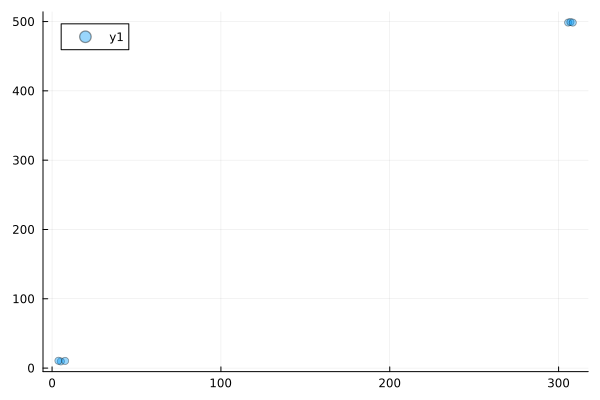

In [3]:
scatter(simulated_separableish_features[:,11], simulated_separableish_features[:,3], ma=0.4)

In [4]:
function loss(X, Y, w)
    pred = Y - X * w
    return pred' * pred
end
function grad(X, Y, w)
    pred = X * w - Y
    return vec(transpose(X) * pred)
end

grad (generic function with 1 method)

# GD and Nesterov's accelerated gradient mathod

In [5]:
function gd(f, df, num_steps, lr, inits, period)
    losses = zeros(Int(num_steps/period))
    weights = inits
    for step in 1:num_steps
        gradient = -df(weights)
        weights += lr * gradient
        if step%period == 0
            losses[Int(step/period)] = f(weights)[1]
        end
        if step % (Int(num_steps/20)) == 0
            print(losses[Int(step/period)])
            print("\n")
        end
    end
    return weights, losses
end

weights = zeros(dim,1)
f = x->loss(simulated_separableish_features, simulated_labels, x)
df = x->grad(simulated_separableish_features, simulated_labels, x)

wieghts, losses = gd(f, df, 1e7, 1e-7, weights, 500)


0.007143587581620913
0.005564620396310778
0.004636973446809258
0.004021379300911348
0.003571266113078618
0.003215451067021875
0.002917728264619357
0.0026591064882134077
0.0024292418903791406
0.0022221855893224257
0.002034253756338085
0.0018629560839095738
0.0017064541721554661
0.0015632856938394809
0.00143222206809519
0.00131219336185648
0.0012022471876807386
0.0011015249240283738
0.0010092468806232073
0.000924702189762504


([0.009103553793708478; 0.06397806377237497; … ; -0.027616556242416854; 0.0011852809892653297;;], [2.830195021574756, 2.671071365521227, 2.5209266653816083, 2.3792542455098618, 2.2455760215964835, 2.119440887280244, 2.0004231918022564, 1.8881213035649203, 1.7821562547481706, 1.6821704624090583  …  0.0009254305704697456, 0.0009253496109489284, 0.0009252686585127123, 0.0009251877131598475, 0.0009251067748899991, 0.0009250258437024705, 0.0009249449195963171, 0.0009248640025715418, 0.0009247830926270701, 0.000924702189762504])

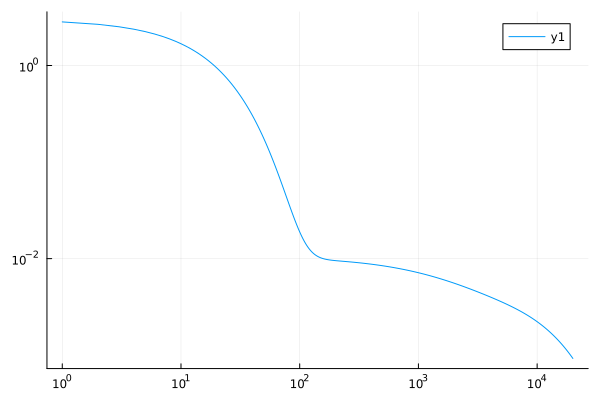

In [6]:
plot(losses, xaxis=:log, yaxis=:log)

In [7]:
print(losses[length(losses)])

0.000924702189762504

In [8]:
function nag(f, df, num_steps, lr, inits, period)
    losses = zeros(Int(num_steps/period))
    x = inits
    x_prev = inits
    y = inits
    for k in 1:num_steps
        x_prev = x
        x = y - lr * df(y)
        y = x + (k-2) / (k+1.0) * (x-x_prev)
        if k%period == 0
            losses[Int(k/period)] = f(x)[1]
        end
        if k % (Int(num_steps/20)) == 0
            print(losses[Int(k/period)])
            print("\n")
        end
    end
    return x, losses
end

weights = zeros(dim,1)
f = x->loss(simulated_separableish_features, simulated_labels, x)
df = x->grad(simulated_separableish_features, simulated_labels, x)

wieghts, losses = nag(f, df, 1e7, 1e-7, weights, 500)

1.0970382037616793e-9
5.436448229281166e-11
2.4984839307194914e-12
1.2377084224681012e-12
3.889311345740392e-12
5.078416810461774e-12
5.086437054239463e-12
4.510152741390349e-12
3.642335231590848e-12
2.705219084209193e-12
1.8567856060967433e-12
1.165885204117681e-12
6.512166593036392e-13
3.0718355999640474e-13
1.079586816417892e-13
1.782070373074902e-14
8.610192933879271e-16
2.4917590374015074e-14
6.407152709496379e-14
1.0077838095237107e-13


([0.011542177115377314; 0.07852624913697337; … ; -0.030325440041028797; -0.0060312523759529675;;], [0.010186101931768624, 0.014461887628593392, 0.012392069241622774, 0.008703153720541314, 0.006210361358397745, 0.00505272071762222, 0.004495445613815759, 0.003995889433609229, 0.00346792576547895, 0.003023534565662687  …  6.649858831572217e-14, 3.902558155271848e-14, 1.766717055841897e-14, 4.27773127641857e-15, 1.646661323774678e-17, 5.2461033982162805e-15, 1.9503084948080364e-14, 4.1540832993340165e-14, 6.944050325209418e-14, 1.0077838095237107e-13])

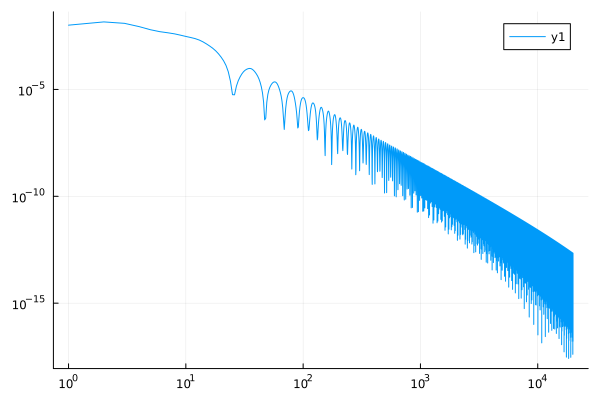

In [9]:
plot(losses, xaxis=:log, yaxis=:log)

In [10]:
print(losses[length(losses)])

1.0077838095237107e-13

# ODE Simulation

In [11]:
f = x->loss(simulated_separableish_features, simulated_labels, x)
df = x->grad(simulated_separableish_features, simulated_labels, x)

function ODE(du, u, p, t)
    return -(2*p[1]+1) / t * du - p[1]^2 * t^(p[1]-2) * df(u)
end

function simulate(p, s, N, period, step, xinit, vinit)
    h = step
    if s==1
        alg = Euler()
    elseif s==2
        alg = Midpoint()
    elseif s==4
        alg = RK4()
    elseif s==8
        alg = DP8()
    else
        return nothing
    end
    x = xinit
    v = vinit
    loop = Int(N/period)
    losses = zeros(loop)

    soln=nothing
    
    for j in 1:loop
        losses[j] = f(x)[1]
        if j%1000 == 0
            println("Loop="*string(j)*"\t Loss="*string(losses[j]))
        end
        t_start = 0.01 + (j-1)*h*period
        t_end = 0.01 + j*h*period
        tspan = (t_start, t_end)
        prob = SecondOrderODEProblem(ODE, v, x, tspan, p)
        soln = solve(prob, alg, dt=h, adaptive=false)
        x = soln[12:22, period+1]
        v = soln[1:11, period+1]
    end
    return losses, soln
end

simulate (generic function with 1 method)

In [12]:
N = 1000000
truncate = 0
period = 10
pvalues = [2,3,4,5]
#nrange = period * range(1, Int(N/period)) - period + 1

svals = [4,4,4,4]
steps = [1e-5, 1e-5, 1e-5, 1e-5]

weights = zeros(dim)
dweights = zeros(dim)

losslst = zeros(length(svals),Int(N/period))

for i in 1:length(svals)
    s = svals[i]
    p = pvalues[i]
    println("p="*string(p))
    p = [p]
    losses, soln = simulate(p, s, N, period, steps[i], weights, dweights)
    losslst[i,:] = losses
end


p=2
Loop=1000	 Loss=0.010774165730026786
Loop=2000	 Loss=0.010354971813761828
Loop=3000	 Loss=0.00796453214658633
Loop=4000	 Loss=0.006825637390556755
Loop=5000	 Loss=0.005742684503415458
Loop=6000	 Loss=0.004886246841875999
Loop=7000	 Loss=0.0042006030995562675
Loop=8000	 Loss=0.0036688258986108126
Loop=9000	 Loss=0.0032399473050476113
Loop=10000	 Loss=0.0028666327411239214
Loop=11000	 Loss=0.002513182371205311
Loop=12000	 Loss=0.002166416102669094
Loop=13000	 Loss=0.0018305714160776925
Loop=14000	 Loss=0.001515498448297857
Loop=15000	 Loss=0.0012301752286701486
Loop=16000	 Loss=0.000978683555789491
Loop=17000	 Loss=0.0007615427714798454
Loop=18000	 Loss=0.0005768397897768665
Loop=19000	 Loss=0.00042275690937179584
Loop=20000	 Loss=0.00029762623758742727
Loop=21000	 Loss=0.00019969171038219675
Loop=22000	 Loss=0.00012625368995888896
Loop=23000	 Loss=7.385113428891259e-5
Loop=24000	 Loss=3.858258614695349e-5
Loop=25000	 Loss=1.6688840549338466e-5
Loop=26000	 Loss=4.8699110608648186e-6


In [13]:
plot(losslst[1,:], label="q=2", xaxis=:log, yaxis=:log, lw=2)
plot!(losslst[2,:], label="q=3", xaxis=:log, yaxis=:log, lw=2)
plot!(losslst[3,:], label="q=4", xaxis=:log, yaxis=:log, lw=2)
plot!(losslst[4,:], label="q=5", xaxis=:log, yaxis=:log, lw=2)
plot!(legend=:bottomleft)

In [19]:
N = Int(1e7)
truncate = 0
period = 100
pvalues = [1,2,4]
nrange = Array(0:period:N)
losslst = zeros(length(svals)+2,Int(N/period))

svals = [1,2,4]
steps = [1e-6, 1e-5, 1e-4]

weights = zeros(dim)
dweights = zeros(dim)
f = x->loss(simulated_separableish_features, simulated_labels, x)
df = x->grad(simulated_separableish_features, simulated_labels, x)

w, gdlosses = gd(f, df, N, 1e-7, weights, period)
losslst[1,:] = gdlosses
plot(gdlosses, label="GD", xaxis=:log, yaxis=:log)

w, naglosses = nag(f, df, N, 1e-7, weights, period)
losslst[2,:] = naglosses
plot!(naglosses, label="NAG", xaxis=:log, yaxis=:log)

for i in 1:length(svals)
    s = svals[i]
    losses, soln = simulate(2,s,N,period, steps[i],weights,dweights)
    losslst[2+i,:] = losses
    plot!(losses, label=string(s)*"th order DD")
end


0.007143587581620981
0.00556462039631101
0.004636973446809361
0.004021379300911411
0.003571266113078764
0.003215451067021942
0.0029177282646191795
0.002659106488213254
0.0024292418903789363
0.0022221855893224465
0.0020342537563381464
0.0018629560839095339
0.001706454172155214
0.00156328569383944
0.0014322220680952089
0.0013121933618564536
0.0012022471876808535
0.0011015249240283811
0.0010092468806233376
0.0009247021897624721
1.0970382368736345e-9
5.436446189279057e-11
2.4984822976949095e-12
1.2377037175734246e-12
3.8892999808294556e-12
5.0784086850586e-12
5.086442399212672e-12
4.5101476669408564e-12
3.642342121582389e-12
2.705237653966841e-12
1.8567965916239432e-12
1.1658911844727408e-12
6.51220977580051e-13
3.071846959557204e-13
1.0795972151016485e-13
1.7821009078461344e-14
8.6092480539199575e-16
2.491751971571575e-14
6.40710874583285e-14
1.0077921891767262e-13
Loop=1000	 Loss=0.010774575868390465
Loop=2000	 Loss=0.010355165983813343
Loop=3000	 Loss=0.007964546418886897
Loop=4000	 Los

In [31]:
plot(losslst[1,:], label="GD", xscale=:log10, yaxis=(:log10, [10^(-24),10]))
plot!(losslst[2,:], label="NAG", xscale=:log10, yscale=:log10)
plot!(losslst[3,:], label="1st order DD", xscale=:log10, yaxis=(:log10, [10^(-24),10]))
plot!(losslst[4,:], label="2nd order DD", xscale=:log10, yscale=:log10)
plot!(losslst[5,:], label="4th order DD", xscale=:log10, yscale=:log10)
plot!(legend=:bottomleft)